#  Investigate a Database Project
####  TMDB movies Database
    

The following code uses Pandas to import the TMDB movie database from a csv file provided by Kaggle. https://www.kaggle.com/tmdb/tmdb-movie-metadata.

The first five rows are shown to give an idea of what the data looks like.

In [1]:
# import necessary libarires
import numpy as np
import pandas as pd

# import data from csv file
df = pd.read_csv(r"C:\\Users\\rstau\\OneDrive\\Documents\\data_analysis\\tmdb-movies.csv")

### Data Wrangling
The data required some cleaning before evaluating. the following actions are need for the data. when neccesary I have listed when I used the help of others code in order to produce the correct results and those references are listed.
1. remove duplicate values (reference sheet 1) stackoverflow.com remove duplicate values)
2. remove movies that have 0 revenue or 0 budget (reference sheet 2) stackoverflow.com remove 0 values)
3. drop columns that are not relevant for our analysis (reference sheet 3) hackersandslackers.com removing columns from dataframe)
4. assigned data types to certain varibles

In [2]:
#remove duplicate ID numbers
df = df.drop_duplicates(subset='id', keep="last")

#remove the entire row of values that have 0 for revenue or budget
df = df[(df != 0).all(1)]


#drop the columns that are not relevant for our analysis
df = df.drop(['imdb_id','homepage','tagline', 'overview', 'keywords'], axis = 1)

#assign neccessary data types to the following varibles
df = df.astype({'budget': int, 'revenue': int, 'budget_adj': int, 'revenue_adj': int})
df['release_date'] = pd.to_datetime(df['release_date'])
#style the dataframe to use currency when neccesary
df.style.format({'revenue': '${0:,.0f}', 'budget': '${0:,.0f}', 'budget_adj': '${0:,.0f}', 'revenue_adj': '${0:,.0f}'})

,id,popularity,budget,revenue,original_title,cast,director,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,32.985763,"$150,000,000","$1,513,528,810",Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vincent D'Onofrio|Nick Robinson,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legendary Pictures|Fuji Television Network|Dentsu,2015-06-09 00:00:00,5562,6.500000,2015,"$137,999,939","$1,392,445,892"
1,76341,28.419936,"$150,000,000","$378,436,354",Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nicholas Hoult|Josh Helman,George Miller,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Productions,2015-05-13 00:00:00,6185,7.100000,2015,"$137,999,939","$348,161,292"
2,262500,13.112507,"$110,000,000","$295,238,201",Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel Elgort|Miles Teller,Robert Schwentke,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wagon Entertainment|NeoReel,2015-03-18 00:00:00,2480,6.300000,2015,"$101,199,955","$271,619,025"
3,140607,11.173104,"$200,000,000","$2,068,178,225",Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam Driver|Daisy Ridley,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,2015-12-15 00:00:00,5292,7.500000,2015,"$183,999,919","$1,902,723,129"
4,168259,9.335014,"$190,000,000","$1,506,249,360",Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle Rodriguez|Dwayne Johnson,James Wan,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights Capital|Dentsu|One Race Films,2015-04-01 00:00:00,2947,7.300000,2015,"$174,799,923","$1,385,748,801"
5,281957,9.110700,"$135,000,000","$532,950,503",The Revenant,Leonardo DiCaprio|Tom Hardy|Will Poulter|Domhnall Gleeson|Paul Anderson,Alejandro GonzÃ¡lez IÃ±Ã¡rritu,156,Western|Drama|Adventure|Thriller,Regency Enterprises|Appian Way|CatchPlay|Anonymous Content|New Regency Pictures,2015-12-25 00:00:00,3929,7.200000,2015,"$124,199,945","$490,314,247"
6,87101,8.654359,"$155,000,000","$440,603,537",Terminator Genisys,Arnold Schwarzenegger|Jason Clarke|Emilia Clarke|Jai Courtney|J.K. Simmons,Alan Taylor,125,Science Fiction|Action|Thriller|Adventure,Paramount Pictures|Skydance Productions,2015-06-23 00:00:00,2598,5.800000,2015,"$142,599,937","$405,355,075"
7,286217,7.667400,"$108,000,000","$595,380,321",The Martian,Matt Damon|Jessica Chastain|Kristen Wiig|Jeff Daniels|Michael PeÃ±a,Ridley Scott,141,Drama|Adventure|Science Fiction,Twentieth Century Fox Film Corporation|Scott Free Productions|Mid Atlantic Films|International Traders|TSG Entertainment,2015-09-30 00:00:00,4572,7.600000,2015,"$99,359,956","$547,749,654"
8,211672,7.404165,"$74,000,000","$1,156,730,962",Minions,Sandra Bullock|Jon Hamm|Michael Keaton|Allison Janney|Steve Coogan,Kyle Balda|Pierre Coffin,91,Family|Animation|Adventure|Comedy,Universal Pictures|Illumination Entertainment,2015-06-17 00:00:00,2893,6.500000,2015,"$68,079,970","$1,064,192,016"
9,150540,6.326804,"$175,000,000","$853,708,609",Inside Out,Amy Poehler|Phyllis Smith|Richard Kind|Bill Hader|Lewis Black,Pete Docter,94,Comedy|Animation|Family,Walt Disney Pictures|Pixar Animation Studios|Walt Disney Studios Motion Pictures,2015-06-09 00:00:00,3935,8.000000,2015,"$160,999,929","$785,411,574"


### <font color= black> Questions that will be addressed: <font>
1. Which movies have the longest and shortest run times?
2. Which directors earned the most money in their careers?
3. What is the average revenue, the max revenue and the name of the titles produced by those directors?
4. Which movies generated the most revenue all-time after adjusting for inflation?
5. Is the budget of a movie correlated to the revenue it generates?
6. Is the budget of a movie correlated to the popularity score it receives?
7. Has the amount of revenue increased over the years as technologies in the industry have been evolving? how does the analysis compare when we account for inflation?

### Question #1
Which movies have the longest and shortest run times?

In [3]:
#finds the location of the movie with the longest runtime
i = df['runtime'].argmax()
#uses the location find to give details on whole movie
df.iloc[i]

id                                                                  43434
popularity                                                       0.534192
budget                                                           18000000
revenue                                                            871279
original_title                                                     Carlos
cast                    Edgar RamÃ­rez|Alexander Scheer|Fadi Abi Samra...
director                                                  Olivier Assayas
runtime                                                               338
genres                                       Crime|Drama|Thriller|History
production_companies    Egoli Tossell Film AG|Canal+|Arte France|Films...
release_date                                          2010-05-19 00:00:00
vote_count                                                             35
vote_average                                                          6.2
release_year                          

In [4]:
#finds the location of the movie with the longest runtime
j = df['runtime'].argmin()
#uses the location find to give details on whole movie
df.iloc[j]

id                                                                  24914
popularity                                                       0.208637
budget                                                                 10
revenue                                                                 5
original_title                                                Kid's Story
cast                    Clayton Watson|Keanu Reeves|Carrie-Anne Moss|K...
director                                              Shinichiro Watanabe
runtime                                                                15
genres                                          Science Fiction|Animation
production_companies                                          Studio 4Â°C
release_date                                          2003-06-02 00:00:00
vote_count                                                             16
vote_average                                                          6.8
release_year                          

The longest run time was 338 minutes for a movie titled "Carlos" from 2010

The shortest run time was 15 minutes for a movie title "Kid's Story" from 2003

#### Question #2 and #3:
Which directors earned the most money in their careers?

what is the average revenue, the max revenue and the name of the titles produced by those directors?

two seperate data frames were created using the groupby function and then merged together. data frame df1 was created to find the top 10 revenue earning directors and the statistics associated with that. 

The second data frame, df2, was used to bring the title of the movies for the directors in the list, making it helpful to make connections to the films that earned the revenue. The code `.apply(lambda x: ','.join(x))` was referenced from examples on  geeksforgeeks.org as a way to join text. (reference sheet: 4) geeksforgeeks.org joining text)

In this analysis I focused on the overal total revenue earned, but other variables such as average or max could also be work analyzing.

In [5]:
# top 10 directors sorted by total revenue earned
df1 = (df.groupby('director')['revenue'].agg(['sum','mean','max','count']).sort_values(ascending=False, by='sum'))
# connecting all the titles that are associated with each director
df2 = df.groupby('director')['original_title'].apply(lambda x: ', '.join(x))

# merging the two databases into one table
directors_top_10 = pd.merge(df1,df2, how='inner', left_index=True, right_index=True).head(10)
# formatting variables that are currencies. (reference sheet: 5) stackoverflow.org. currency formatting in python)
directors_top_10.style.format({'sum': '${0:,.0f}', 'mean': '${0:,.0f}', 'max': '${0:,.0f}'})

,sum,mean,max,count,original_title
director,,,,,
Steven Spielberg,"$9,018,563,772","$334,020,880","$920,100,000",27,"Bridge of Spies, Close Encounters of the Third Kind, A.I. Artificial Intelligence, Indiana Jones and the Kingdom of the Crystal Skull, The Adventures of Tintin, War Horse, Catch Me If You Can, Minority Report, Lincoln, Amistad, The Lost World: Jurassic Park, The Color Purple, War of the Worlds, Munich, The Terminal, 1941, Indiana Jones and the Temple of Doom, Raiders of the Lost Ark, E.T. the Extra-Terrestrial, Saving Private Ryan, Indiana Jones and the Last Crusade, Always, Hook, The Sugarland Express, Jaws, Schindler's List, Jurassic Park"
Peter Jackson,"$6,523,244,659","$593,022,242","$1,118,888,979",11,"The Hobbit: The Battle of the Five Armies, The Lovely Bones, The Lord of the Rings: The Fellowship of the Ring, The Lord of the Rings: The Two Towers, Heavenly Creatures, The Hobbit: An Unexpected Journey, The Lord of the Rings: The Return of the King, The Hobbit: The Desolation of Smaug, King Kong, Braindead, The Frighteners"
Michael Bay,"$4,917,208,171","$447,018,925","$1,123,746,996",11,"Transformers: Age of Extinction, Transformers: Revenge of the Fallen, Pearl Harbor, Transformers: Dark of the Moon, Bad Boys II, Pain & Gain, The Island, Transformers, Bad Boys, The Rock, Armageddon"
Christopher Nolan,"$4,167,548,502","$520,943,563","$1,081,041,287",8,"Interstellar, Inception, The Dark Knight, Insomnia, The Dark Knight Rises, Batman Begins, The Prestige, Memento"
David Yates,"$4,154,295,625","$1,038,573,906","$1,327,817,822",4,"Harry Potter and the Half-Blood Prince, Harry Potter and the Deathly Hallows: Part 1, Harry Potter and the Deathly Hallows: Part 2, Harry Potter and the Order of the Phoenix"
Robert Zemeckis,"$3,869,690,869","$257,979,391","$677,945,399",15,"The Walk, A Christmas Carol, Forrest Gump, Flight, Contact, Back to the Future, The Polar Express, Used Cars, Beowulf, Romancing the Stone, Cast Away, What Lies Beneath, Back to the Future Part II, Who Framed Roger Rabbit, Back to the Future Part III"
Chris Columbus,"$3,725,631,503","$413,959,056","$976,475,550",9,"Pixels, Percy Jackson & the Olympians: The Lightning Thief, Bicentennial Man, Harry Potter and the Philosopher's Stone, Harry Potter and the Chamber of Secrets, Rent, Home Alone 2: Lost In New York, Home Alone, Mrs. Doubtfire"
Tim Burton,"$3,665,414,624","$229,088,414","$1,025,467,110",16,"Big Eyes, Alice in Wonderland, Sleepy Hollow, Planet of the Apes, Ed Wood, Dark Shadows, Frankenweenie, Big Fish, Pee-wee's Big Adventure, Charlie and the Chocolate Factory, Sweeney Todd: The Demon Barber of Fleet Street, Batman Returns, Mars Attacks!, Batman, Beetlejuice, Edward Scissorhands"
Ridley Scott,"$3,584,430,808","$170,687,181","$595,380,321",21,"The Martian, Exodus: Gods and Kings, Robin Hood, Black Hawk Down, Hannibal, Body of Lies, Prometheus, G.I. Jane, The Counselor, Legend, Kingdom of Heaven, A Good Year, American Gangster, Alien, 1492: Conquest of Paradise, White Squall, Gladiator, Blade Runner, Black Rain, Thelma & Louise, Someone to Watch Over Me"


Text(0, 0.5, 'Revenue in the millions of US dollars (witout inlation)')

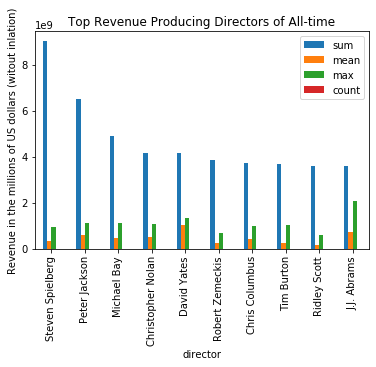

In [6]:
#plot bar plot of merged dataframes
directorsplot = directors_top_10.plot.bar()
directorsplot.set_title("Top Revenue Producing Directors of All-time")
directorsplot.set_ylabel('Revenue in the millions of US dollars (witout inlation)')

The table and graph from the code show the top 10 directors. Steven Spilberg is by far the biggest for overall sum of revenue, which could be influenced by the amount of movies he has produced. also worthing noting in the results is the numbers for J.J Abrams. His max for a movie produced was significantly highier. when we look at the movies of J.J abrams we see that Star wars was the one that earned alot. 

Having the movies of the director included in the table helps make sense of why the data looks the way it does.

#### Question #4:
Which movies generated the most revenue all-time after adjusting for inflation?

Similar groupby function was used in this question, however in this analysis I used the adjusted for inflation revenue numbers in order to make a list of the 10 most successful movies produced.

In [7]:
# grouping by original titles, sorting by the highiest revenue earning
df_top_10_movies = df.groupby(['original_title','director','release_year'])['revenue_adj'].agg(['max']).sort_values(ascending=False, by='max').head(10)
 
# formatting currency values    
df_top_10_movies.style.format('${0:,.2f}')

,,,max
original_title,director,release_year,
Jaws,Steven Spielberg,1975,"$1,907,005,841.00"
Star Wars: The Force Awakens,J.J. Abrams,2015,"$1,902,723,129.00"
E.T. the Extra-Terrestrial,Steven Spielberg,1982,"$1,791,694,309.00"
The Net,Irwin Winkler,1995,"$1,583,049,536.00"
One Hundred and One Dalmatians,Clyde Geronimi|Hamilton Luske|Wolfgang Reitherman,1961,"$1,574,814,739.00"
The Avengers,Joss Whedon,2012,"$1,443,191,435.00"
The Empire Strikes Back,Irvin Kershner,1980,"$1,424,626,187.00"
Jurassic World,Colin Trevorrow,2015,"$1,392,445,892.00"
Jurassic Park,Steven Spielberg,1993,"$1,388,863,311.00"


The interesting results of this table is that Steven Spielberg appears 3 times as the top earning movies. That would explain our previous findings of steven spilberg being the top earning director of all time.

#### Question #5:
Is the budget of a movie correlated to the revenue it generates?

the fuction below was created to calculate the correlation coefficient for two variables. The code for the function follow the example of some code shared on stackoverflow.com. (references 6: 4 stackoverflow.com calculate the correlation)
https://stackoverflow.com/questions/48587192/i-have-written-a-code-to-calculate-the-correlation-between-two-pandas-series-ca

the correlation coefficient measures the linear relationship between two data sets. a value of +1 or -1 imply an exact linear relationship, while 0 implys no correlation.

Also include as part of this function is creating a scatterplot of the values.

In [8]:
# function created to calculate correlation coefficient and create a scatter plot
def correlation (x, y):
    std_x = (x - x.mean()) / x.std(ddof=0)
    std_y = (y - y.mean()) / y.std(ddof=0)
    
    %pylab inline
    import matplotlib.pyplot as plt

    plt.scatter(x, y,s=5)
           
    return (std_x * std_y).mean()

Populating the interactive namespace from numpy and matplotlib


Text(0.5, 0, 'budget adjust for inflation (millions of US dollars)')

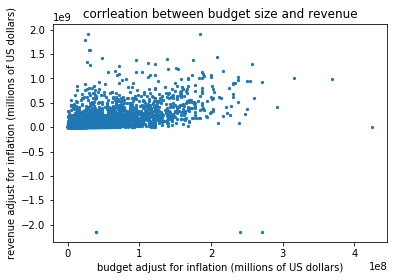

In [9]:
# running correlation function
correlation(df['budget_adj'], df['revenue_adj'])
plt.title('corrleation between budget size and revenue')
plt.ylabel('revenue adjust for inflation (millions of US dollars)')
plt.xlabel('budget adjust for inflation (millions of US dollars)')

The resulting value for correlation coefficient of 0.64.

Values of 0.7 or highier are usually an indication of a strong correlation, while .3 through .7 are considered moderate positive linear relationship. So .64 is almost a strong correlation, but not quite. Our conclusion from this analysis is that highier budgets, while sometimes may produce a movie will earn a larger revenue, it is not always the case.

#### Question #6:
Is the budget of a movie correlated to the popularity score it receives?

Using the same function that we created earlier called correlation, we will analysis the correlation between budget and popularity.

Populating the interactive namespace from numpy and matplotlib


Text(0.5, 0, 'budget adjust for inflation (millions of US dollars)')

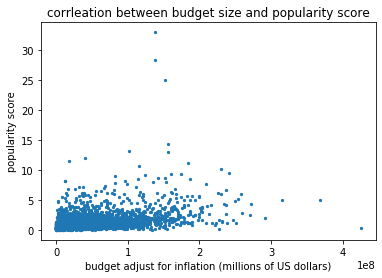

In [10]:
# running correlation function
correlation(df['budget_adj'], df['popularity'])
plt.title('corrleation between budget size and popularity score')
plt.ylabel('popularity score')
plt.xlabel('budget adjust for inflation (millions of US dollars)')

The results of the analysis are even weaker than the budget/revenue analysis in question #4. The value of .51 indicates on a moderate linear relationship. important to note is that correlation does not imply causation. the value of .51 indicates to me that there are other variables that are impacting the popularity score, possibly more so than budget.

#### Question #7:

Has the amount of revenue increased over the years as technologies in the industry have been evolving? how does the analysis compare when we account for inflation?

This analysis will require the following table and 3 graphs in order to get the besult understanding of the data.

first, the table shows the mean value for revenue generated for movies released in each given year. It's important for these values to be accounting for inflation. also worth noting is the count of movies released each year has significantly increased.

In [11]:
# calculates average revenue (adjust for inflation) for each year, and the count of movies produced. sorted 
# from latest to earliest.
df_release_year = df.groupby(["release_year"])['revenue_adj'].agg(['mean', 'count']).sort_values(ascending=False, by='release_year')

#formats revenue variable to currency
df_release_year.style.format({'mean': '${0:,.2f}'})

,mean,count
release_year,,
2015,"$150,666,739.32",160
2014,"$134,367,474.47",165
2013,"$126,627,975.24",180
2012,"$145,373,726.14",158
2011,"$114,029,683.53",199
2010,"$122,496,407.17",178
2009,"$97,625,815.31",174
2008,"$114,990,277.53",167
2007,"$118,810,960.97",165


I'll discuss this table at the end. Secondly, the scatterplot below shows the yearly mean values that were calculated in the the table above. 

The code used to create the scatterplot was create based from a learning example found on a webpage on bsdmag.org. (reference #7: bsdmag.org creating a historgram)

Text(0.5, 0, 'Years')

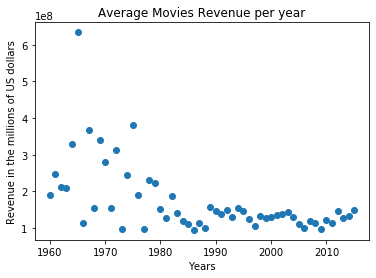

In [12]:
#sets up configuration for a scatter plot
fig = plt.figure()
ax = fig.add_subplot(1,1,1)

#prints scatter plot of each years average movies revenue (adjusted for inflation)
ax.scatter(df_release_year.index,df_release_year['mean'])
plt.title('Average Movies Revenue per year')
plt.ylabel('Revenue in the millions of US dollars')
plt.xlabel('Years')


Important to note here is that in the early part of the movie industry, the mean values varied widely year to year. this is due to the smaller year samples of movies.

A big take away from this scatter plot is that after adjusting for inflation, the revenue for the average movie has actually decreased over the years. Possibly explanations could be that movies produced in the later part of the lifetime of the movie industry had more forms of entertainment to compete with for revenue and were less of a wide spread phenomenom.

Lastly, I wanted to see what the effects of adjusting for inflation were. I produced 2 box and whisker plots that can be used to compare un-adjusted revenue values vs adjusted for inflation revenue values.

for the sake of readability, the data was grouped by decades, using the for loop code below. Also, Outliers were removed from the data using `showfliers=False`. 

chart 1 is un-adjusted. chart 2 is adjusted.

*note: code used for producing the decade value was created with help found on stackoverflow.com (reference 8: stackoverflow.com seperating list of years into decades)

** note: in a example from stackoverflow.com a user suggested using the seaborn function to create these desired box plots. (reference 9: stackoverflow.com seaborn library for boxplots)

Text(0, 0.5, 'Revenue in the millions of US dollars')

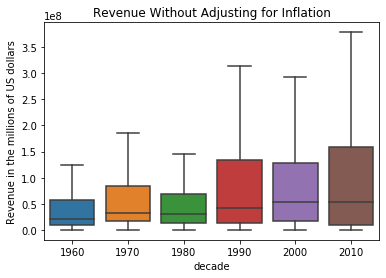

In [13]:
#creates a new variable in the df dataframe called decade
for year in df:
    df['decade'] = numpy.floor(df['release_year'] / 10) * 10
    df['decade'] = df['decade'].astype(int)

#creates a boxplot grouped by decades, excluding outliers which shows revenue statistics when not accounting for inflation    
import seaborn as sns      
boxplot1 = sns.boxplot(y='revenue', x='decade', data=df, showfliers=False)
#format plot
boxplot1.set_title('Revenue Without Adjusting for Inflation')
boxplot1.set_ylabel('Revenue in the millions of US dollars')

Text(0, 0.5, 'Revenue in the millions of US dollars')

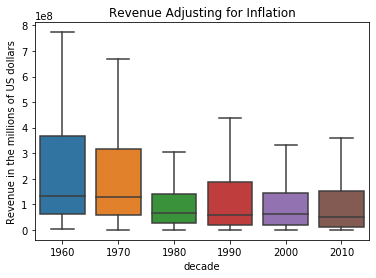

In [14]:
#creates a boxplot grouped by decades, excluding outliers which shows revenue statistics when accounting for inflation
boxplot2 = sns.boxplot(y='revenue_adj', x='decade', data=df, showfliers=False)
#format plot
boxplot2.set_title('Revenue Adjusting for Inflation')
boxplot2.set_ylabel('Revenue in the millions of US dollars')

# conclusion
The trends are what I was expecting, however still interesting. Without adjusting for revenue one would think that later produced movies are the most successful. That is not the case with the adjusted values which results look similar to the scatter plot shown above, indicating a downward trend.
#### limitations 
revenue shouldn't be the all end factor to determine popularity of a movie, especially when comparing across this large of a timeframe. the movie industry has changed alot over these decades and may not have the same audiences and demographics. for example, a popular movie in the early decades were more family friendly and could appeal to all demographics while a movie later could still be popular, but not as sutible for children, so appeals to a smaller demographic.

# References:
1) stackoverflow.com remove duplicate values: https://stackoverflow.com/questions/12497402/python-pandas-remove-duplicates-by-columns-a-keeping-the-row-with-the-highest

2) stackoverflow.com remove 0 values: https://stackoverflow.com/questions/27020312/drop-row-in-pandas-dataframe-if-any-value-in-the-row-equals-zero/27020741

3) hackersandslackers.com removing columns from dataframe: https://hackersandslackers.com/pandas-dataframe-drop/


4) geeksforgeeks.org joining text: https://www.geeksforgeeks.org/join-two-text-columns-into-a-single-column-in-pandas/

5) stackoverflow.com currency formatting in python: https://stackoverflow.com/Questions/320929/currency-formatting-in-python

6) stackoverflow.com calculate the correlation: https://stackoverflow.com/questions/48587192/i-have-written-a-code-to-calculate-the-correlation-between-two-pandas-series-ca

7) bsdmag.org creating a historgram: https://bsdmag.org/wp-content/uploads/2016/06/infographics-final.jpg

8) stackoverflow.com seperating list of years into decades) https://stackoverflow.com/questions/31481589/separating-list-of-years-into-decades

9) stackoverflow.com seaborn library for boxplots: https://stackoverflow.com/questions/25284859/grouping-boxplots-in-seaborn-when-input-is-a-dataframe